In [1]:
import tensorflow as tf
from skimage.metrics import structural_similarity as ssim
import os
import matplotlib.pyplot as plt
import statistics
import pickle

import math
import cv2
import numpy as np
from numpy import cos as cos
from numpy import sin as sin
from numpy import sqrt as sqrt
from numpy import arctan2 as arctan2
from matplotlib import pyplot as plt
import os
import datetime
import time
import matplotlib 

import pressure_img_generation
import output_display
import wave_propagation
# 関係する初期値を準備する
def init_param():
    ### l_ambda: 波長
    f0 = 1.15e06
    c0 = 1900
    l_ambda = c0/f0
    ### N: 画素数, p: サンプリングサイズ（画素の大きさ）
    N = 512
    R = 19.0/2*1e-3
    L = 6*R
    p = L/N

    ### z: スクリーンの距離
    #z = 4*l_ambda
    z = 0.5*1e-3
    T0 = 3e-03

    return N, z, p, l_ambda, T0, f0, c0, R
    
# Normlization function for output
def amp_abs(amp_cgh_img):
    #new_amp_cgh = amp_cgh_img / amp_cgh_img.max() * 255.0
    cutoff_val = 3
    cutoff_arr=cutoff_val*np.ones(amp_cgh_img.shape)
    amp_cgh_img_trunc = np.minimum(amp_cgh_img,cutoff_arr)
    new_amp_cgh = amp_cgh_img_trunc / cutoff_val * 255.0
    return new_amp_cgh

def phaser_draw(phase_dist):
    new_phase_dist = phase_dist
    while new_phase_dist.min() < 0:
      new_phase_dist += math.pi*2
    new_phase_dist = (new_phase_dist % (2*math.pi))/(2*math.pi)
    new_phase_dist = new_phase_dist * 255
    return new_phase_dist

def show_imgs(imgs):
    for i in range(len(imgs)):
      img = imgs[i]
      plt.figure(figsize=(6,6))
      plt.imshow(img)
      plt.gray()
    plt.show()

def calculate_alpha(phase, f0):
    # Hologram
    c_h = 2246
    rho_h = 1240
    Z_h = c_h * rho_h
    k_h = (2*math.pi*f0) / c_h
    
    #transducer surface (assume gel to be impedance matched with hologram)
    Z_t = Z_h
    # water
    rho_m = 1000
    c_m = 1480
    Z_m = c_m * rho_m
    k_m = (2*math.pi*f0) / c_m
    #Hologram Thickness
    delta_phase = phase % (2*math.pi)
    delta_T = delta_phase / (k_m-k_h)
    Thickness = T0 - delta_T

    alpha_t_top = (4*Z_t*(Z_h**2)*Z_m);
    alpha_t_bot_1 = (Z_h**2 * (Z_t + Z_m)**2) * pow(tf.math.cos((k_h * Thickness)), 2);
    alpha_t_bot_2 = (Z_h**2 + Z_t*Z_m)**2 * pow(tf.math.sin((k_h * Thickness)), 2);

    alpha_t = pow(alpha_t_top / (alpha_t_bot_1 + alpha_t_bot_2), 0.5)
    return alpha_t

# Calculation of PSNR ratio in dB
def calculate_psnr(original, comparison):
    M = comparison.shape[0]
    differ = np.sum(pow((original.numpy() - comparison), 2)) / (M*M)
    PSNR = 20*np.log10(255 / np.sqrt(differ))
    return PSNR

In [2]:
def pinwheel_matrix(N,R,nSections):
    if nSections%2 != 0:
        print('n_sections must be even for pinwheel')

    theta = 2*np.pi/nSections
    mymat = np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            myAngle = np.arctan2(j-N/2,i-N/2) + np.pi
            mySection = np.floor(myAngle/theta)
            if (i-N/2)*(i-N/2) + (j-N/2)*(j-N/2) < R*R and mySection % 2 == 0:
                mymat[i,j]=1
    mymat = tf.constant(mymat)
    mymat = tf.dtypes.cast(mymat, tf.float64)
    return mymat

def bullseye_matrix(N,R1,R2):
    mymat = np.zeros((N,N))
    for i in range(N):
        for j in range(N):
            r2 = (i-N/2)*(i-N/2) + (j-N/2)*(j-N/2)
            if r2 < R2*R2 and r2 > R1*R1: 
                mymat[i,j]=1
    mymat = tf.constant(mymat)
    mymat = tf.dtypes.cast(mymat, tf.float64)
    return mymat

def img_to_matrix(img_file_name,N):
    #in_dir = '../generating_inputs/test_package/'
    #amp_img_np = cv2.imread(in_dir + 'test_image_' + image_number + '_amp.png', cv2.IMREAD_GRAYSCALE)
    amp_img_np = cv2.imread(img_file_name, cv2.IMREAD_GRAYSCALE)
    size = (N, N)
    amp_img_np = cv2.resize(amp_img_np, size)
    target_amp=1
    # amp_img = tf.constant(amp_img_np / 255.0 * target_amp)
    amp_img = tf.constant(255.0 - amp_img_np / 255.0 * target_amp) # inverted
    amp_img = tf.dtypes.cast(amp_img, tf.float64)
    return amp_img

In [3]:
def band_limited_angular_h(k, N, l_ambda, z, p, f0, c0):
    N = N * 2
    if N%2==0:
        k_vec = np.arange(-N/2, N/2)
    else:
        k_vec = np.arange(-((N-1)/2), ((N-1)/2)+1)
    k_vec *= (2*math.pi) / (N*p)
    
    k_vec[int(N/2)] = 0
    
    k_vec = np.fft.ifftshift(k_vec)
    kx, ky = np.meshgrid(k_vec, k_vec)

    k = 2*math.pi*f0 / c0

    kz = pow(k**2 -  (pow(kx, 2) + pow(ky, 2))+0j, 0.5)
    sqrt_kx2_ky2 = pow(pow(kx,2) + pow(ky, 2), 0.5)

    H = np.conj(np.exp(1j * z * kz))
    D = (N-1)*p

    # cutoff k
    kc = k * pow(0.5 * D**2 / (0.5 * D**2 + z**2) , 0.5)
    
    # zero out any k vectors that exceed the cutoff
    kh = np.where(sqrt_kx2_ky2 > kc, 0, H)
    return kh

In [4]:
def angular_spectrumCW(input_image, select_h):
  M = input_image.shape[0]
  init_plane_add = tf.pad(input_image, ((M//2,M//2), (M//2,M//2)), 'constant')
  N = init_plane_add.shape[0]
  fft_length = M #for case of 512 which is the case up here input size 256 x 256
  init_shift = tf.signal.fft2d(init_plane_add)
  prop = tf.signal.ifft2d(tf.math.multiply(init_shift, select_h))
  N = prop.shape[0]
  M = N // 2
  start_num = M//2
  end_num = N - M//2
  pressure = prop[start_num:end_num, start_num:end_num]

  return pressure
  
def loss_func():
    #intensity = tf.dtypes.cast(pressure*tf.math.conj(pressure), tf.float64)
    #target = tf.dtypes.cast(target_img*tf.math.conj(target_img), tf.float64)
    intensity = tf.abs(pressure*tf.math.conj(pressure))
    target = tf.abs(target_img*tf.math.conj(target_img))

    loss = tf.reduce_sum(pow(target-intensity,2))

    return loss

In [5]:
### 初期パラメーター
N, z, p, l_ambda, T0, f0, c0, R = init_param()
k = 2*np.pi/l_ambda
image_number = '5'
target_amp = 1

##### Target Amplitude #####
'''in_dir = '../generating_inputs/test_package/'
amp_img_np = cv2.imread(in_dir + 'test_image_' + image_number + '_amp.png', cv2.IMREAD_GRAYSCALE)
size = (N, N)
amp_img_np = cv2.resize(amp_img_np, size)
original = tf.dtypes.cast(amp_img_np, tf.float64)
amp_img = tf.constant(amp_img_np / 255.0 * target_amp)
amp_img = tf.dtypes.cast(amp_img, tf.float64)'''
amp_img = pinwheel_matrix(N,R/p,2)
#amp_img = bullseye_matrix(N,R/p*0.6,R/p*0.75)
#amp_img = img_to_matrix("birdie.png",N)

##### Input #####
input_int = pressure_img_generation.circle_matrix(N,R/p)

##### SLMへの照明光分布 #####
light_img = tf.dtypes.cast(input_int, tf.complex128)

##### 初期の位相分布 #####
in_plane_phase = np.zeros((N,N))

# 強度分布画像の場合
target = amp_img
target_img = tf.dtypes.cast(target, tf.complex128)

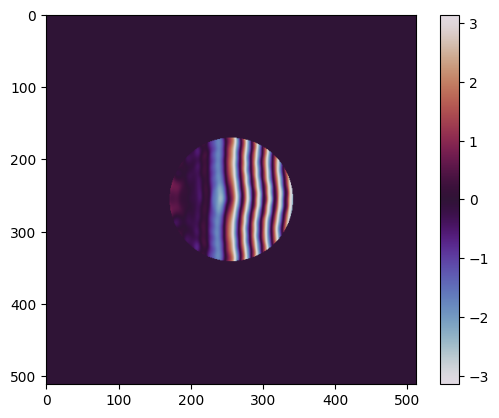

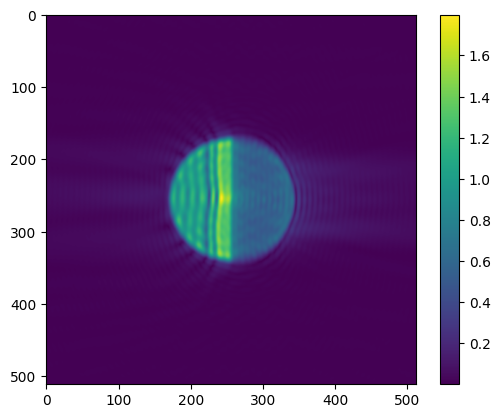

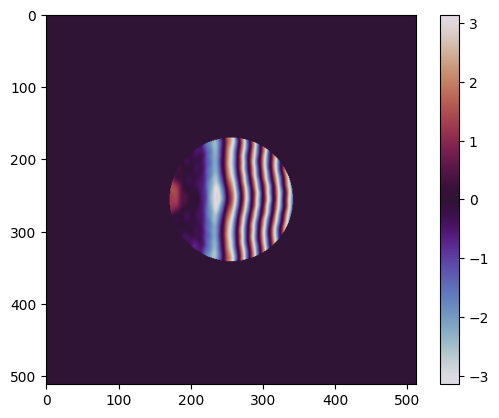

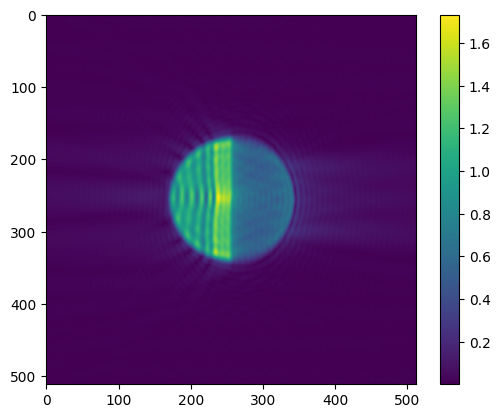

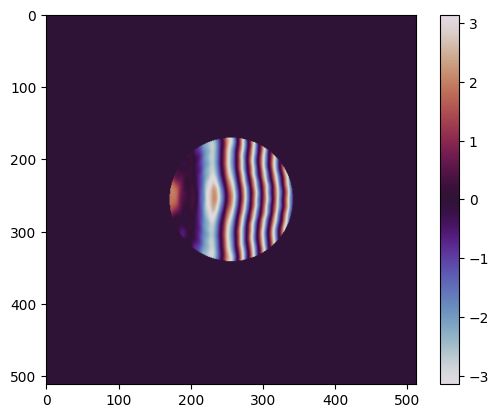

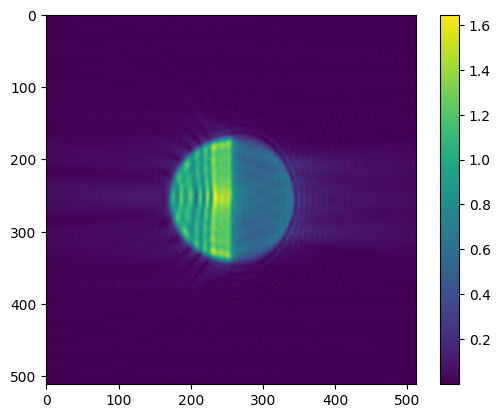

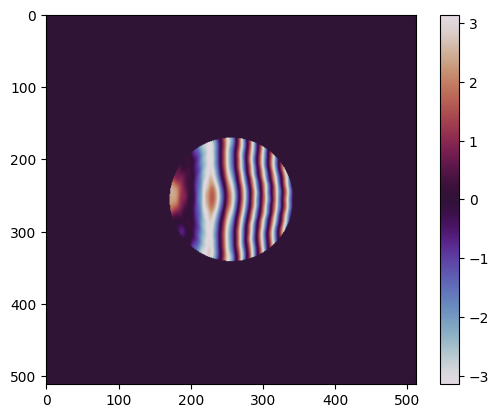

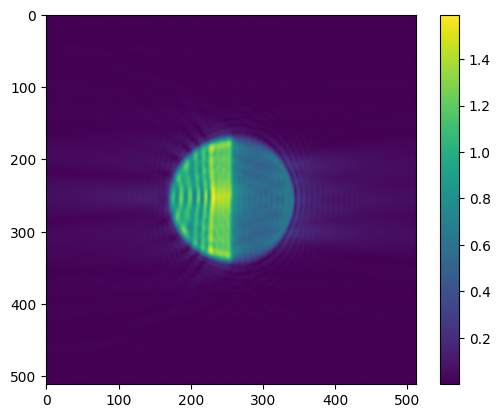

In [9]:
in_plane_phase = np.zeros((N,N))
loss_record = []
psnr_log = []
ssim_log = []

##### 角スペクトル #####
#forward_h = band_limited_angular_h(k, N, l_ambda, z, p, f0, c0)
forward_h = wave_propagation.band_limited_propagator(k,N,z,p)
back_h = tf.math.conj(forward_h)

for step_s in range(400):
  # propagate to image plane
  input_plane = light_img*np.exp(1j*in_plane_phase)
  pressure = angular_spectrumCW(input_plane, forward_h)
  #pressure = wave_propagation.propagate(input_plane,forward_h)

  # record loss function
  loss_record.append(loss_func())

  if ((step_s+1)%100)==0:
    output_display.draw_phase(in_plane_phase)
    output_display.draw_pressure_complex(pressure)

  # in image plane, update pressure to target but retain phase
  retain_phase = tf.math.angle(pressure).numpy()
  at_target = target_img*np.exp(1j*retain_phase)

  # propagate back
  back_pressure = angular_spectrumCW(at_target, back_h)
  #back_pressure = wave_propagation.propagate(at_target, back_h)

  # update phase
  phaseK = tf.math.angle(back_pressure)
  in_plane_phase = phaseK.numpy()
  in_plane_phase = np.where(input_int  == 0, 0, in_plane_phase)

  

#exporting_phase = phaser_draw(in_plane_phase)
#all_loss_to_csv = np.array(loss_record)
#np.savetxt('test_image_' + image_number + '_loss_record_IASA.csv', np.array(loss_record), delimiter=',')
#cv2.imwrite('test_image_' + image_number + '_phase_ex_IASA.png', exporting_phase)
     

In [8]:
print(tf.reduce_max(amp_img).numpy())
print(tf.reduce_max(prop_inten).numpy())
print(tf.reduce_min(prop_inten).numpy())

1.0
2.7006915460304626
9.650368236599246e-11


In [10]:
# c1 > c2

#c1 = 2200 # PLA
c1 = 1300 # vero ultra resin
c2 = 936 # easyflo 90
f = 1.15e6

H = 1/f/(1/c2-1/c1)
delta_z = (in_plane_phase % (2*np.pi)) / (2*np.pi*f*(1/c2-1/c1))

h1 = H-delta_z
h2 = np.flipud(delta_z) # idk i think you need to reflect over x or y axis

h1[input_int==0]=0
h2[input_int==0]=0

In [11]:
print(H)

0.002906832298136645


In [12]:
import trimesh

def heightmap_to_mesh(heightmap,input_map,x_values,y_values):
    X, Y = np.meshgrid(x_values, y_values)
    verts = np.column_stack([X.ravel(), Y.ravel(), heightmap.ravel()])

    faces = []
    n = len(x_values)
    for i in range(n-1):
        for j in range(n-1):
            # Two triangles per quad
            a = i*n + j
            b = a + 1
            c = a + n
            d = c + 1
            if input_map[a]*input_map[b]*input_map[c] > 0:
                faces.append([a, b, c])
            if input_map[a]*input_map[b]*input_map[c] > 0:
                faces.append([b, d, c])
    top_mesh = trimesh.Trimesh(vertices=verts, faces=faces)

    top_mesh.remove_unreferenced_vertices()

    myTriangles = top_mesh.triangles

    full_mesh = trimesh.creation.truncated_prisms(tris=myTriangles)

    return full_mesh


In [13]:
N, z, p, l_ambda, T0, f0, c0, R = init_param()
x_values = np.arange(0,N*p,p)
y_values = np.arange(0,N*p,p)
input_map = input_int.numpy().ravel()

mesh1 = heightmap_to_mesh(h1,input_map,x_values,y_values)
#mesh1.export("h1_resin.stl")
mesh1.show()

0.001


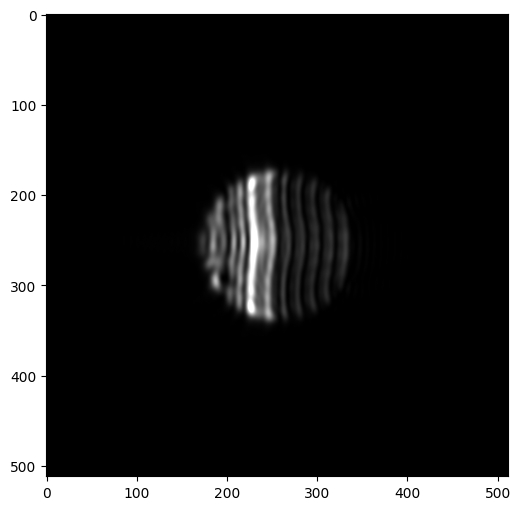

In [34]:
# replace easyflo (c2) with glycerol (c0)
zstar = 1e-3
print(zstar)
forward_h_zstar = band_limited_angular_h(k, N, l_ambda, zstar, p, f0, c0)
bottom_half_phase_map = h1 * 2*np.pi*f*(1/c0-1/c1)
input_plane = light_img*np.exp(1j*bottom_half_phase_map)
pressure = angular_spectrumCW(input_plane, forward_h_zstar)
prop_inten = tf.abs(pressure * tf.math.conj(pressure))
show_imgs([amp_abs(prop_inten.numpy())])